In [1]:
using LinearAlgebra
using Random
using Plots
using JLD2

In [2]:
A = [-1 0; 0 1] # Matrix used to manipulate data.
n = 100 # Number of data points in each quadrant.
N = n * 4 # Total number of data points.

X_pos = hcat(rand(Float64, (2, n)), -rand(Float64, (2, n)))
X_neg = hcat(A * rand(Float64, (2, n)), -A * rand(Float64, (2, n)))

X = hcat(X_pos, X_neg)
T = hcat(ones(1, n * 2), zeros(1, n * 2))

1×400 Array{Float64,2}:
 1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [3]:
N0 = 2 # Input size.
N1 = 3 # First hidden layer size.
N2 = 3 # Second hidden layer size.

W = [
    (2 * rand(Float64, N1, N0) .- 1) / sqrt(N0),
    (2 * rand(Float64, N2, N1) .- 1) / sqrt(N1),
    (2 * rand(Float64, 1, N2) .- 1) / sqrt(N2)
]

3-element Array{Array{Float64,2},1}:
 [-0.5367104421006453 -0.31693582470538884; -0.6885833692256387 -0.21465035073657016; 0.20391780196088155 0.05944226945908547]
 [0.5122275024731296 -0.48862009728619943 -0.37311232491485485; -0.5718752767652252 0.3249924091550423 0.3112098891187301; 0.09197133697175199 0.03725372881433903 -0.06496072559317889]
 [-0.45316940817867873 -0.2631606133912753 -0.3091374153471819]

In [4]:
# @save "data/multilayer_perceptron.jld2" A n N X_pos X_neg X T W
@load "data/multilayer_perceptron.jld2" A n N X_pos X_neg X T W

8-element Array{Symbol,1}:
 :A
 :n
 :N
 :X_pos
 :X_neg
 :X
 :T
 :W

In [5]:
lightred = colorant"#f4ccccff"
blue = colorant"#4a86e8ff"
red = colorant"#e06666ff"
lightblue = :lightblue1

function scatter_2d(x1, x2, c; reuse=false, kwargs...)
    f = reuse ? scatter! : scatter
    
    return f(
        x1,
        x2;
        marker=(c, 5, Plots.stroke(0)),
        legend=false,
        kwargs...
    )
end

function scatter_2d!(args...; kwargs...)
    return scatter_2d(args...; reuse=true, kwargs...)
end

scatter_2d! (generic function with 1 method)

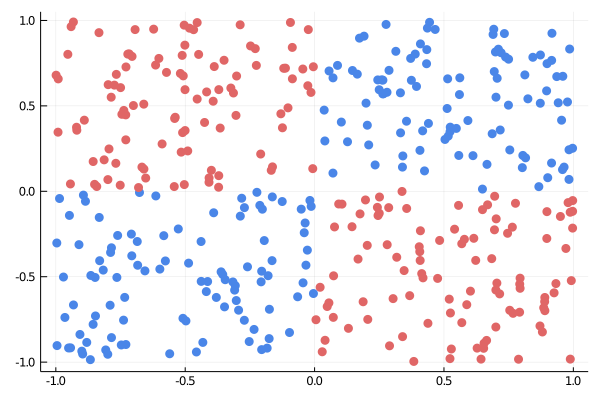

In [6]:
scatter_2d(X_pos[1, :], X_pos[2, :], blue)
scatter_2d!(X_neg[1, :], X_neg[2, :], red)

In [7]:
Base.@kwdef mutable struct MLP
    W::Array{Array{Float64, 2}, 1}
    η::Float64 # Learning rate.
end

mlp = MLP(W=W, η=1.0)

MLP([[0.3924827318690231 0.14912896089944802; 0.5620950145563309 -0.028763670595772305; 0.42546918931667127 -0.5209988320658999], [0.2000786161724925 -0.04921800211346689 0.42487073019642974; -0.35207418639100874 0.13811250696494257 0.49228863250870597; 0.05029798611754482 -0.03746685356042688 0.399935633946673], [0.15143494053904977 -0.49037310407783363 -0.31986192176455214]], 1.0)

In [8]:
# Sigmoid.
σ(x) = 1 / (1 + exp(-x))

function forward(W::Array{Array{Float64, 2}, 1}, X::Array{Float64, 2})
    return reduce((Xi, Wi) -> σ.(Wi * Xi), W; init=X)
end

# Assumes an MLP with two hidden layers for educational clarity.
function train!(mlp::MLP, X::Array{Float64, 2}, T::Array{Float64, 2})
  # Number of training examples.
  N = size(X, 2)

  # Feedforward.
  H1 = σ.(mlp.W[1] * X)
  H2 = σ.(mlp.W[2] * H1)
  Y = σ.(mlp.W[3] * H2)

  # Backpropagation.
  δY = Y - T
  ∂H2 = H2 .* (1 .- H2)
  δH2 = transpose(mlp.W[3]) * δY .* ∂H2
  ∂H1 = H1 .* (1 .- H1)
  δH1 = transpose(mlp.W[2]) * δH2 .* ∂H1

  # Weight gradients.
  ΔW1 = mlp.η * δH1 * transpose(X) / N
  ΔW2 = mlp.η * δH2 * transpose(H1) / N
  ΔW3 = mlp.η * δY * transpose(H2) / N

  # Weight updates.
  mlp.W[1] -= ΔW1
  mlp.W[2] -= ΔW2
  mlp.W[3] -= ΔW3
end

function loss(W::Array{Array{Float64, 2}, 1}, X::Array{Float64, 2}, T::Array{Float64, 2})
    Y = forward(W, X)
    
    return sum(-(T .* log.(Y) + (1 .- T) .* log.(1 .- Y)))
end

loss (generic function with 1 method)

In [9]:
function contourf_2d(x1, x2, f, c; reuse=false, kwargs...)
    g = reuse ? contourf! : contourf
    
    g(
        x1,
        x2,
        f,
        legend=false,
        color=c,
        line=0,
        kwargs...
    )
end

function contourf_2d!(args...; kwargs...)
    contourf_2d(args...; reuse=true, kwargs...)
end

contourf_2d! (generic function with 1 method)

In [10]:
x1 = x2 = range(-1, 1; length=100)

f(W, i=1) = (x1, x2) -> forward(W, reshape([x1, x2], 2, 1))[i, 1]

f (generic function with 2 methods)

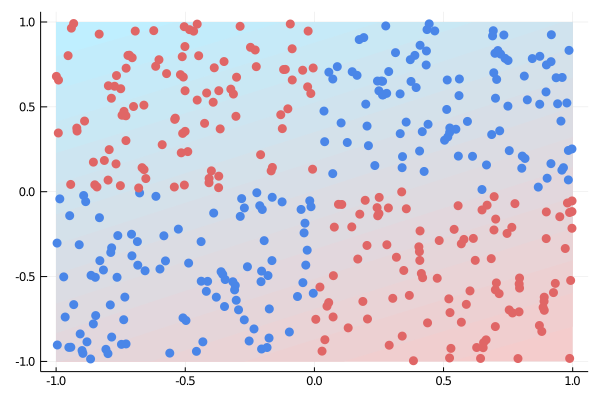

In [11]:
contourf_2d(x1, x2, f(mlp.W), [lightred, lightblue])
scatter_2d!(X_pos[1, :], X_pos[2, :], blue)
scatter_2d!(X_neg[1, :], X_neg[2, :], red)

In [12]:
epochs = 20000
snapshots = []

for e in 1:epochs
    train!(mlp, X, T)
    
    if e % 2000 == 0
        println(loss(mlp.W, X, T))
    end
    
    if e % 100 == 0
        # Save snapshots of weights at different epochs.
        push!(snapshots, MLP(deepcopy(mlp.W), mlp.η))
    end
end

277.241919568051
276.7986845428628
32.71652333273314
13.235696493315265
5.277060703578734
3.027190662574222
2.1342199295871658
1.6419162992981347
1.3311659948444887
1.1176846296460985


┌ Info: Saved animation to 
│   fn = /Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif
└ @ Plots /Users/tyronjung/.julia/packages/Plots/LWw1t/src/animation.jl:104


Plots.AnimatedGif("/Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif")
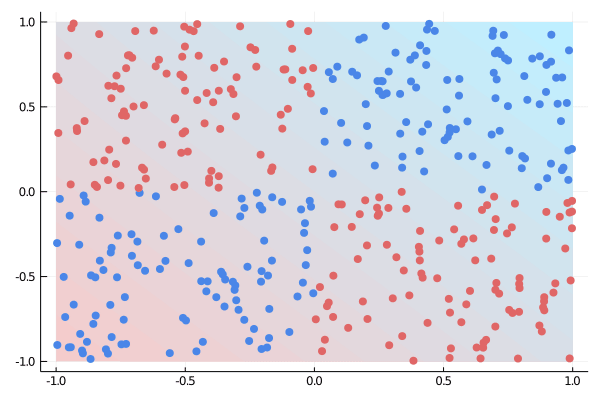

In [13]:
@gif for s in snapshots
    contourf_2d(x1, x2, f(s.W), [lightred, lightblue])
    scatter_2d!(X_pos[1, :], X_pos[2, :], blue)
    scatter_2d!(X_neg[1, :], X_neg[2, :], red)
end

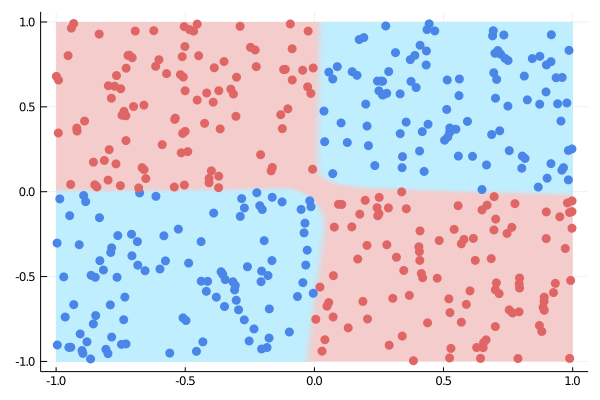

In [14]:
contourf_2d(x1, x2, f(mlp.W), [lightred, lightblue])
scatter_2d!(X_pos[1, :], X_pos[2, :], blue)
scatter_2d!(X_neg[1, :], X_neg[2, :], red)

In [15]:
function scatter_3d(x1, x2, x3, c; reuse=false, kwargs...)
    f = reuse ? scatter! : scatter
    
    return f(
        x1,
        x2,
        x3;
        marker=(c, 5, Plots.stroke(0)),
        legend=false,
        kwargs...
    )
end

function scatter_3d!(args...; kwargs...)
    return scatter_3d(args...; reuse=true, kwargs...)
end

scatter_3d! (generic function with 1 method)

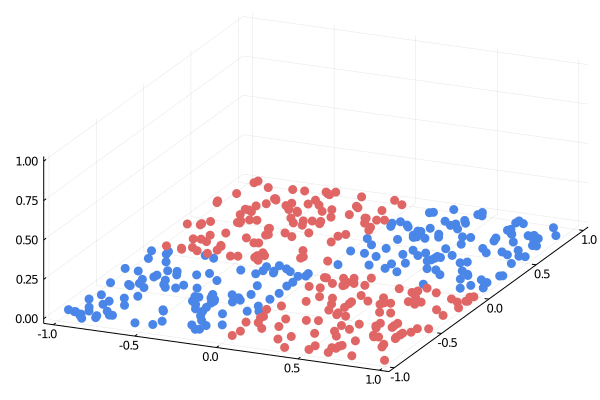

In [16]:
# Transformation step 0: Raw inputs.

scatter_3d(X_pos[1, :], X_pos[2, :], zeros(n * 2), blue; camera=(30, 60))
scatter_3d!(X_neg[1, :], X_neg[2, :], zeros(n * 2), red)

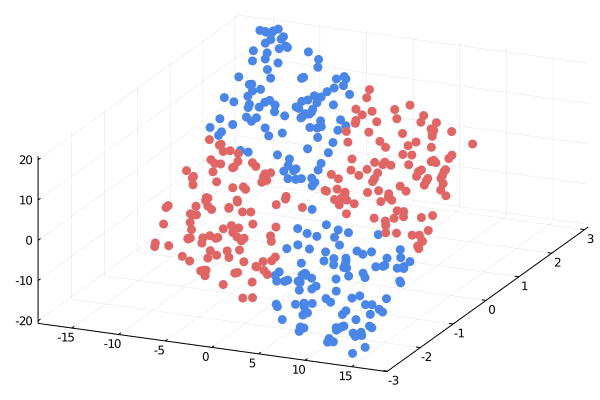

In [17]:
# Transformation step 1: Linear 2D to 3D.

Z1_pos = mlp.W[1] * X_pos
Z1_neg = mlp.W[1] * X_neg

scatter_3d(Z1_pos[1, :], Z1_pos[2, :], Z1_pos[3, :], blue; camera=(30, 60))
scatter_3d!(Z1_neg[1, :], Z1_neg[2, :], Z1_neg[3, :], red)

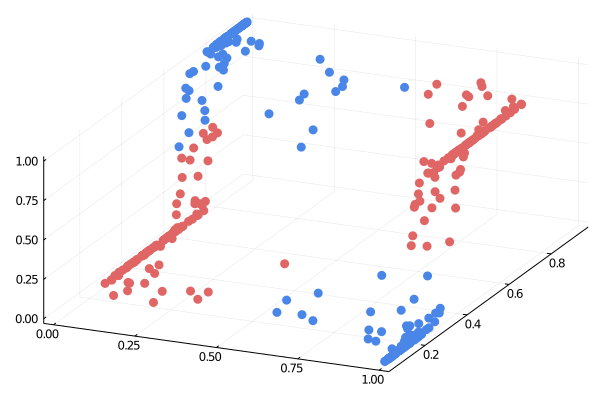

In [18]:
# Transformation step 2: Nonlinear folding.

H1_pos = σ.(Z1_pos)
H1_neg = σ.(Z1_neg)

scatter_3d(H1_pos[1, :], H1_pos[2, :], H1_pos[3, :], blue; camera=(30, 60))
scatter_3d!(H1_neg[1, :], H1_neg[2, :], H1_neg[3, :], red)

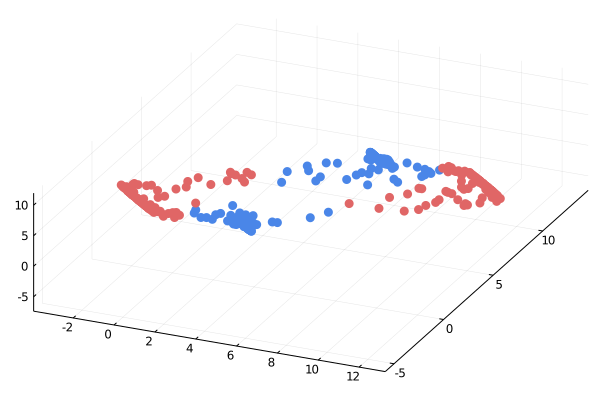

In [19]:
# Transformation step 3: Linear 3D to 3D.

Z2_pos = mlp.W[2] * H1_pos
Z2_neg = mlp.W[2] * H1_neg

scatter_3d(Z2_pos[1, :], Z2_pos[2, :], Z2_pos[3, :], blue; camera=(30, 70))
scatter_3d!(Z2_neg[1, :], Z2_neg[2, :], Z2_neg[3, :], red)

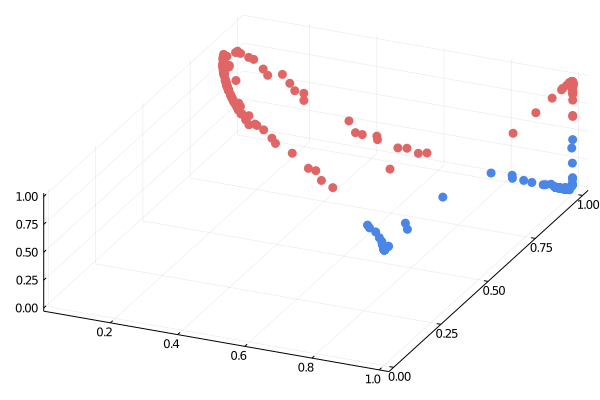

In [20]:
# Transformation step 4: Nonlinear folding.

H2_pos = σ.(Z2_pos)
H2_neg = σ.(Z2_neg)

scatter_3d(H2_pos[1, :], H2_pos[2, :], H2_pos[3, :], blue; camera=(30, 70))
scatter_3d!(H2_neg[1, :], H2_neg[2, :], H2_neg[3, :], red)

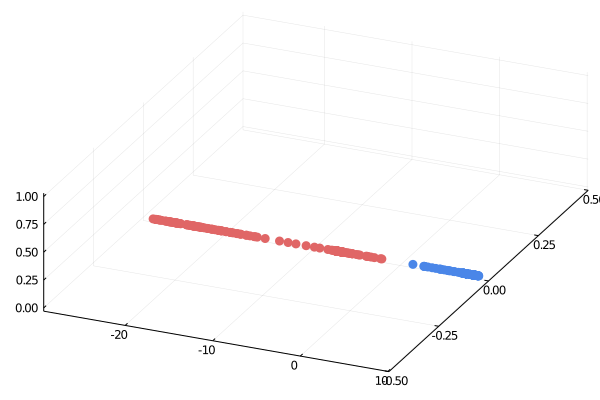

In [21]:
# Transformation step 5: Linear 3D to 1D.

ZY_pos = mlp.W[3] * H2_pos
ZY_neg = mlp.W[3] * H2_neg

scatter_3d(ZY_pos[1, :], zeros(n * 2), zeros(n * 2), blue; camera=(30, 70), ylim = (-0.5, 0.5))
scatter_3d!(ZY_neg[1, :], zeros(n * 2), zeros(n * 2), red)

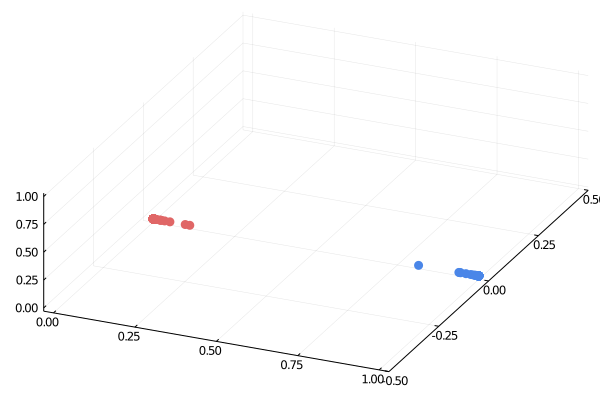

In [22]:
# Transformation step 6: Nonlinear folding.

Y_pos = σ.(ZY_pos)
Y_neg = σ.(ZY_neg)

scatter_3d(Y_pos[1, :], zeros(n * 2), zeros(n * 2), blue; camera=(30, 70), ylim = (-0.5, 0.5))
scatter_3d!(Y_neg[1, :], zeros(n * 2), zeros(n * 2), red)

┌ Info: Saved animation to 
│   fn = /Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif
└ @ Plots /Users/tyronjung/.julia/packages/Plots/LWw1t/src/animation.jl:104


Plots.AnimatedGif("/Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif")
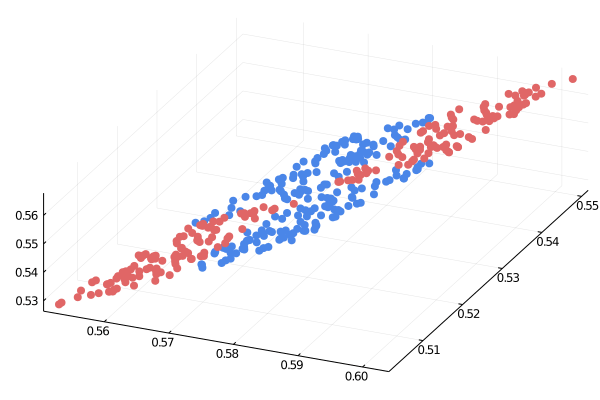

In [23]:
# Show how the transformed input vectors in
# the final hidden layer evolve over time.

@gif for s in snapshots
    H2_pos = forward(s.W[1:2], X_pos)
    H2_neg = forward(s.W[1:2], X_neg)
    
    scatter_3d(H2_pos[1, :], H2_pos[2, :], H2_pos[3, :], blue; camera=(30, 70))
    scatter_3d!(H2_neg[1, :], H2_neg[2, :], H2_neg[3, :], red)
end

┌ Info: Saved animation to 
│   fn = /Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif
└ @ Plots /Users/tyronjung/.julia/packages/Plots/LWw1t/src/animation.jl:104


Plots.AnimatedGif("/Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif")
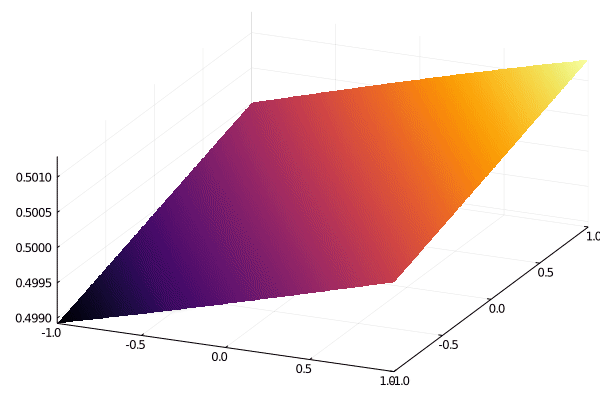

In [24]:
@gif for s in snapshots
    surface(x1, x2, f(s.W); legend=false, camera=(30, 60))
end

┌ Info: Saved animation to 
│   fn = /Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif
└ @ Plots /Users/tyronjung/.julia/packages/Plots/LWw1t/src/animation.jl:104


Plots.AnimatedGif("/Users/tyronjung/Desktop/deep_learning/multilayer_perceptron/tmp.gif")
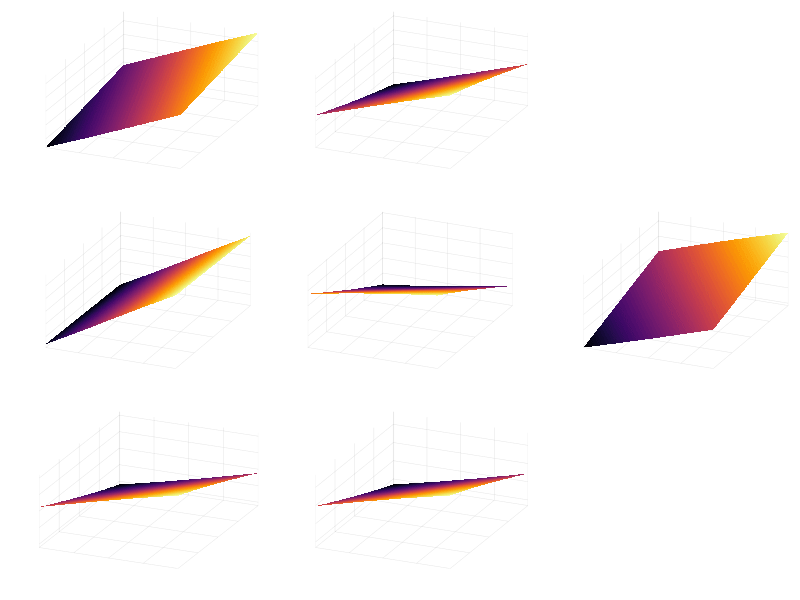

In [25]:
@gif for s in snapshots
    c = cgrad(:default)
    
    p1 = surface(x1, x2, f(s.W[1:1], 1); legend=false, color=c)
    p2 = surface(x1, x2, f(s.W[1:1], 2); legend=false, color=c)
    p3 = surface(x1, x2, f(s.W[1:1], 3); legend=false, color=c)
    
    p4 = surface(x1, x2, f(s.W[1:2], 1); legend=false, color=c)
    p5 = surface(x1, x2, f(s.W[1:2], 2); legend=false, color=c)
    p6 = surface(x1, x2, f(s.W[1:2], 3); legend=false, color=c)
    
    p7 = surface(x1, x2, f(s.W); legend=false, color=c)
    
    l = @layout [a{0.31w} b{0.31w}; c d e; f{0.31w} g{0.31w}]
    p = [p1, p4, p2, p5, p7, p3, p6]
    
    plot(p...; layout=l, camera=(30, 60), size=(800, 600), axis=false)
end